### We will visually see a graph/wave and how it sounds

In [2]:
import numpy as np

sample_rate = 44_100

def sine_wave(frequency, amplitude, duration):
    # this creates evenly spaced numbers over the interval
    # sample_rate * duration = samples
    time = np.linspace(0, duration, round(sample_rate * duration))
    return amplitude * np.sin(2 * np.pi * frequency * time)

In [14]:
import matplotlib.pyplot as plt

# A4 note
wave = sine_wave(frequency=440, amplitude=1, duration=1)

def plot_wave(wave, title):
    plt.figure(figsize=(5, 2))
    plt.plot(wave)
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.title(title)
    plt.grid()
    plt.show()

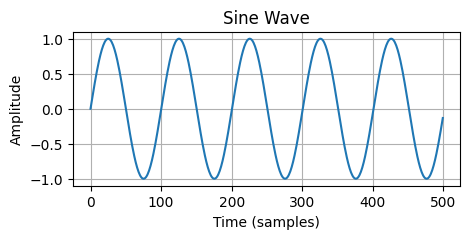

In [9]:
plot_wave(wave[:500], "Sine Wave") # note: wave will be about 44100 samples, hence we only pick the first 500

In [10]:
### We can play the wave using the notebooks builtin audio class
from IPython.display import Audio

def play_wave(wave):
    return display(Audio(wave, rate=sample_rate))

In [15]:
play_wave(wave) # this will be the lenght of the duration

In [16]:
def get_frequency(note, octave):
    return 2 ** (octave - 4 + note / 12) * 440

In [17]:
frequencies = [
    get_frequency(note, octave)
    for octave in range(2, 6)
    for note in range(12)
]
all_notes = np.concatenate([
    sine_wave(freq, amplitude=0.1, duration=0.15)
    for freq in frequencies
])
play_wave(all_notes)

In [19]:
def fade(wave, fade_duration=0.010):
    num_fade_samples = round(sample_rate * fade_duration)
    fade_in = np.linspace(0, 1, num_fade_samples)
    new_wave = wave.copy()
    new_wave[:num_fade_samples] *= fade_in  # fade in
    new_wave[-num_fade_samples:] *= 1 - fade_in  # fade out
    return new_wave

In [20]:
all_notes_with_fadeout = np.concatenate([
    fade(sine_wave(freq, amplitude=0.1, duration=0.15))
    for freq in frequencies
])
play_wave(all_notes_with_fadeout)

In [21]:
wave_A3 = sine_wave(get_frequency(0, 3), 0.5, 1)
wave_Cs3 = sine_wave(get_frequency(4, 3), 0.5, 1) # Cs = C sharp
wave_E3 = sine_wave(get_frequency(7, 3), 0.5, 1)
wave_A4 = sine_wave(get_frequency(0, 4), 0.5, 1)
chord = wave_A3 + wave_Cs3 + wave_E3 + wave_A4
play_wave(fade(chord))

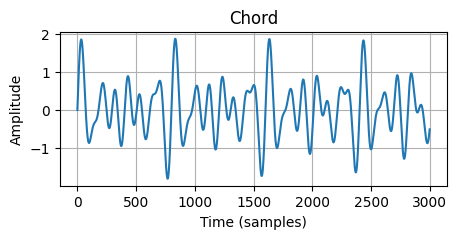

In [22]:
plot_wave(chord[:3000], "Chord")

In [23]:
def get_frequency_by_name(name):
    if name == ".":
        return 0  # silence
    if "b" in name:
        note = "A Bb B C Db D Eb E F Gb G Ab".split().index(name[:-1])
    else:
        note = "A A# B C C# D D# E F F# G G#".split().index(name[:-1])
    octave = int(name[-1:])
    return get_frequency(note, octave)

In [24]:
def get_melody_wave(melody, waveform=sine_wave, tempo=120):
  frequencies = [get_frequency_by_name(note) for note in melody.split()]
  duration = 60 / tempo / 4
  return np.concatenate([
    fade(waveform(freq, 1.0, duration))
    for freq in frequencies
  ])

In [25]:
melody = (
    "C3 E3 G3 C4 E4 G3 C4 E4 "
    "C3 E3 G3 C4 E4 G3 C4 E4 "
    "C3 D3 A4 D4 F4 A4 D4 F4 "
    "C3 D3 A4 D4 F4 A4 D4 F4 "
    "B3 D3 G3 D4 F4 G3 D4 F4 "
    "B3 D3 G3 D4 F4 G3 D4 F4 "
    "C3 E3 G3 C4 E4 G3 C4 E4 "
    "C3 E3 G3 C4 E4 G3 C4 E4 "
)

melody_wave = get_melody_wave(melody)
play_wave(melody_wave)

In [26]:
def square_wave(freq, amplitude, duration):
  num_samples = round(sample_rate * duration)
  if freq == 0:  # in case we just want silence
    return np.zeros(num_samples)
  t = np.linspace(0, duration, num_samples)
  phase = freq * t
  is_positive_half = (phase - np.floor(phase)) < 0.5
  return amplitude * (2 * is_positive_half - 1)

In [27]:
square_wave_A2 = fade(square_wave(get_frequency(0, 2), 0.2, 1.0))
play_wave(square_wave_A2)

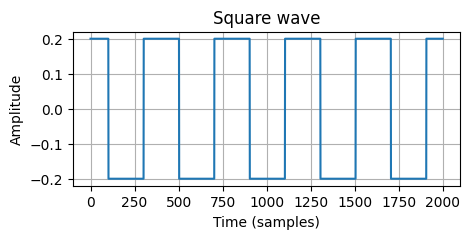

In [28]:
plot_wave(square_wave_A2[500:2500], "Square wave")

In [29]:
bass = (
    "C2 . C2 C2 C1 . . C1 "
    "C2 . C2 C2 C1 . . C1 "
    "D2 . D2 D2 D1 . . D1 "
    "D2 . D2 D2 D1 . . D1 "
    "G1 . G1 G1 . G1 . G1 "
    "G1 . G1 G1 . G1 . G1 "
    "C2 . C2 C2 C1 . . C1 "
    "C2 . C2 C2 C1 . C1 C1 "
)

bass_wave = get_melody_wave(bass, waveform=square_wave)
play_wave(bass_wave)

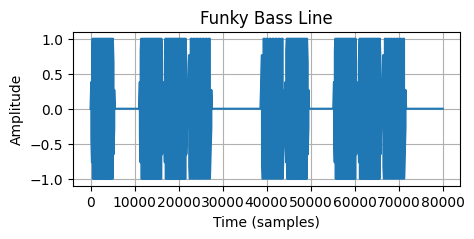

In [30]:
plot_wave(bass_wave[:80_000], "Funky Bass Line")

In [31]:
from math import ceil, log

def apply_echo(wave, freq, decay, min_amplitude=0.01):
  repeats = ceil(log(min_amplitude) / log(decay))
  echo_interval_samples = round(sample_rate / freq)
  samples_with_echo = len(wave) + repeats * echo_interval_samples
  output = np.zeros(samples_with_echo)
  amplitude = 1.0
  for i in range(0, samples_with_echo - len(wave), echo_interval_samples):
    output[i:i+len(wave)] += wave * amplitude
    amplitude *= decay

  return output

In [32]:
bass_with_echo = apply_echo(bass_wave, 1.333, 0.5)
play_wave(bass_with_echo)

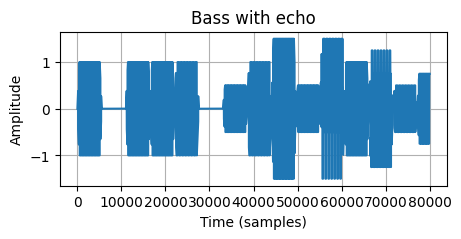

In [33]:
plot_wave(bass_with_echo[:80_000], "Bass with echo")

In [34]:
melody_and_bass = bass_with_echo.copy()
melody_and_bass[:len(melody_wave)] += melody_wave
play_wave(melody_and_bass)

In [35]:
def triangle_wave(freq, amplitude, duration):
    t = np.linspace(0, duration, round(sample_rate * duration))
    phase = freq * t
    phi_frac = phase - np.floor(phase)
    phi_scaled = phi_frac * 2
    abs_dev = np.abs(phi_scaled - 1)
    wave = 2 * abs_dev - 1
    return amplitude * wave

triangle_bass_wave = get_melody_wave(bass, triangle_wave)
play_wave(triangle_bass_wave)

In [36]:
def apply_vibrato(wave, freq, depth):
    duration = len(wave) / sample_rate
    amplitude = sine_wave(freq, 1, duration)
    return wave * (1 + depth * amplitude)

for depth in [0.2, 0.4, 0.6, 0.8, 1.0]:
  chord_with_vibrato = apply_vibrato(chord, 6, depth)
  play_wave(chord_with_vibrato)

In [37]:
def noise(duration):
    return np.random.uniform(-1, 1, round(sample_rate * duration))

play_wave(wave_A4 + 0.2 * noise(1))

In [38]:
music_clip = melody_and_bass[:2 * sample_rate]
for cutoff_frequency in (4000, 2000, 1000, 500):
  frequencies = np.fft.rfft(music_clip)  # real domain to complex frequency domain
  frequencies[cutoff_frequency:] = 0
  low_pass_filtered = np.fft.irfft(frequencies)  # back to real domain
  play_wave(low_pass_filtered)

In [39]:
music_clip = melody_and_bass[:5 * sample_rate]
t = np.linspace(0, 1, len(music_clip))
cutoff_frequency = np.linspace(0.1, 1, len(music_clip)) * 1000
low_pass_filtered = np.zeros_like(music_clip)
alpha = np.exp(-2 * np.pi * cutoff_frequency / sample_rate)
for i in range(1,len(music_clip)):
    low_pass_filtered[i] = (alpha[i] * low_pass_filtered[i-1]
                                  + (1 - alpha[i]) * music_clip[i])

high_pass_filtered = music_clip - low_pass_filtered
play_wave(high_pass_filtered)

In [40]:
left_wave = high_pass_filtered.copy()
right_wave = high_pass_filtered.copy()
pan = np.linspace(0, 1, len(left_wave))
left_wave *= 1 - pan
right_wave *= pan

stereo = np.stack([left_wave, right_wave])
play_wave(stereo)

In [41]:
def plot_sound(stereo, title):
    if stereo.ndim == 1:
        stereo = stereo.reshape(1, -1)
    plt.figure(figsize=(5, 2))
    alpha = 1
    for channel in stereo:
      plt.plot(channel, alpha=alpha)
      alpha = 0.7
    plt.xlabel("Time (samples)")
    plt.ylabel("Amplitude")
    plt.title(title)
    plt.grid()
    plt.show()

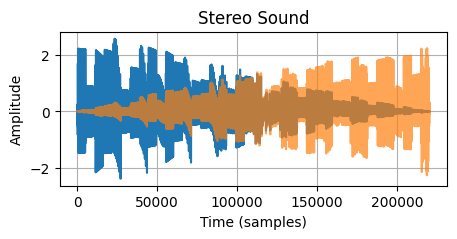

In [42]:
plot_sound(stereo, "Stereo Sound")